Import Libraries

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

from skimage.metrics import structural_similarity as ssim
from sklearn.metrics import confusion_matrix
import seaborn as sns

Function to equalize the histogram of an image

In [3]:
# Histogram Equalization
def histogram_equalization(img):
    # Convert the image to HSV (Hue, Saturation, Value)
    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Apply histogram equalization to the V (Value) channel (intensity)
    hsv_img[..., 2] = cv2.equalizeHist(hsv_img[..., 2])

    # Convert back to BGR color space
    eq_color_img = cv2.cvtColor(hsv_img, cv2.COLOR_HSV2BGR)

    return eq_color_img

Function to perform gamma transformation

In [4]:
#Gamma Transformation
def gamma_correction(img, gamma):
    table = np.array([((i / 255.0) ** gamma) * 255 for i in range(256)]).astype("uint8")
    gamma_corrected = cv2.LUT(img, table)
    return gamma_corrected

Function to increase contrast of an image

In [7]:
def increase_contrast(img, factor=5):
    # Convert the image to float32 to avoid clipping
    img_float = img.astype(np.float32)

    # Increase the contrast by multiplying the pixel values by a factor
    img_float = img_float * factor

    # Clip the values to be within the valid range [0, 255]
    img_float = np.clip(img_float, 0, 255)

    # Convert back to uint8
    contrast_img = img_float.astype(np.uint8)

    return contrast_img

Load a particular image from LOL dataset and perform the above transformations.

In [19]:
import os

# Input and output directories
input_dir = "low/"
hist_eq_dir = "histogram_equalization/"
gamma_dir = "gamma_correction/"
high_contrast_dir = "high_contrast/"
high_dir = "high/"

# Create output directories if not exist
for dir_path in [hist_eq_dir, gamma_dir, high_contrast_dir]:
    os.makedirs(dir_path, exist_ok=True)


# Read all images from input folder
image_files = [f for f in os.listdir(input_dir) if f.endswith(('png', 'jpg', 'jpeg'))]

enhanced_images = []
enhanced_images_labels = []

for image_file in image_files:
    img_path = os.path.join(input_dir, image_file)
    ori_img = cv2.imread(img_path)

    hist_eq_img = histogram_equalization(ori_img)
    gamma_img = gamma_correction(ori_img, gamma=0.3)
    high_contrast_img = increase_contrast(ori_img)

    cv2.imwrite(os.path.join(hist_eq_dir, image_file), hist_eq_img)
    cv2.imwrite(os.path.join(gamma_dir, image_file), gamma_img)
    cv2.imwrite(os.path.join(high_contrast_dir, image_file), high_contrast_img)

    enhanced_images.extend([hist_eq_img, gamma_img, high_contrast_img])
    enhanced_images_labels.extend(["Histogram Equalized", "Gamma Transformed (0.3)", "High Contrast Image"])

In [20]:
def load_image(image_path):
    """Load an image and convert it to RGB format for correct display in Matplotlib."""
    if not os.path.exists(image_path):
        print(f"Image not found: {image_path}")
        return None

    image = cv2.imread(image_path)
    return image

def display_images(input_path, high_contrast_path, hist_equ_path, gamma_correction_path, high_path):
    """Display input and enhanced images side by side."""
    input_image = load_image(input_path)
    high_contrast_image = load_image(high_contrast_path)
    hist_eq_image = load_image(hist_equ_path)
    gamma_img = load_image(gamma_correction_path)
    high_image = load_image(high_path)

    if input_image is None or high_contrast_image is None or hist_eq_image is None or gamma_img is None or high_image is None:
      return

    # Create a side-by-side plot
    fig, axes = plt.subplots(2, 5, figsize=(22, 8))

    axes[0, 0].imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
    axes[0, 0].set_title('Low Light Image')
    axes[0, 0].axis('off')

    axes[0, 1].imshow(cv2.cvtColor(high_contrast_image, cv2.COLOR_BGR2RGB))
    axes[0, 1].set_title('High Contrast Image')
    axes[0, 1].axis('off')

    axes[0, 2].imshow(cv2.cvtColor(hist_eq_image, cv2.COLOR_BGR2RGB))
    axes[0, 2].set_title('Equalized Image')
    axes[0, 2].axis('off')

    axes[0, 3].imshow(cv2.cvtColor(gamma_img, cv2.COLOR_BGR2RGB))
    axes[0, 3].set_title('Gamma Corrected Image')
    axes[0, 3].axis('off')

    axes[0, 4].imshow(cv2.cvtColor(high_image, cv2.COLOR_BGR2RGB))
    axes[0, 4].set_title('High Light Image')
    axes[0, 4].axis('off')

    # Histograms
    axes[1, 0].hist(input_image.ravel(), bins=256, color='red', alpha=0.7)
    axes[1, 0].set_title('Histogram : Low Light Image')

    axes[1, 1].hist(high_contrast_image.ravel(), bins=256, color='green', alpha=0.7)
    axes[1, 1].set_title('Histogram : High Contrast Image')

    axes[1, 2].hist(hist_eq_image.ravel(), bins=256, color='blue', alpha=0.7)
    axes[1, 2].set_title('Histogram : Histogram Equalized Image')

    axes[1, 3].hist(gamma_img.ravel(), bins=256, color='blue', alpha=0.7)
    axes[1, 3].set_title('Histogram : Gamma Corrected Image')

    axes[1, 4].hist(high_image.ravel(), bins=256, color='blue', alpha=0.7)
    axes[1, 4].set_title('Histogram : High Light Image')

    plt.show()

In [21]:
import glob

def process_and_display_images(input_folder, high_contrast_folder, hist_equ_folder, gamma_correction_folder, high_folder):
    """Find input images in input_folder, locate their enhanced versions in output_folder, and display them."""

    ext = ['png', 'jpg', 'bmp']
    input_files = []
    [input_files.extend(glob.glob(os.path.join(input_folder, f'*.{e}'))) for e in ext]

    if not input_files:
        print("No images found in the input folder.")
        return

    for input_file in input_files:
        filename = os.path.basename(input_file)

        # Look for the enhanced image in the output folder
        high_contrast_file = os.path.join(high_contrast_folder, filename)
        hist_equ_file = os.path.join(hist_equ_folder, filename)
        gamma_correction_file = os.path.join(gamma_correction_folder, filename)

        high_file = os.path.join(high_folder, filename)

        if os.path.exists(high_contrast_file) and os.path.exists(high_file) and os.path.exists(hist_equ_file) and os.path.exists(gamma_correction_file) :
            display_images(input_file, high_contrast_file, hist_equ_file, gamma_correction_file, high_file)
        else:
            print(f"Enhanced image or high-quality image not found for {filename}")


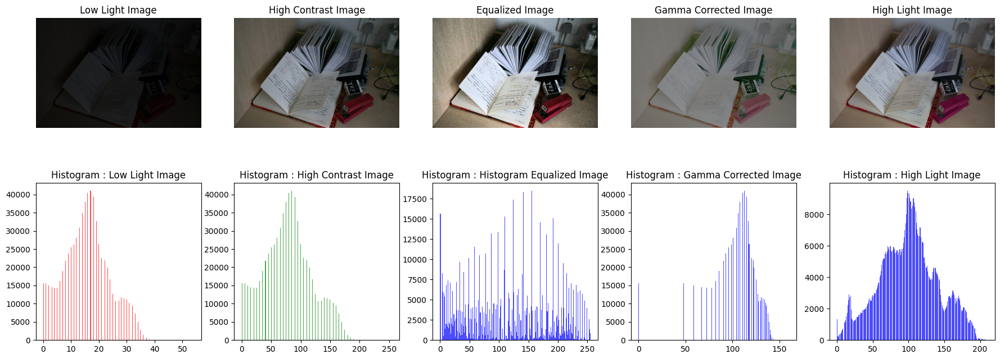

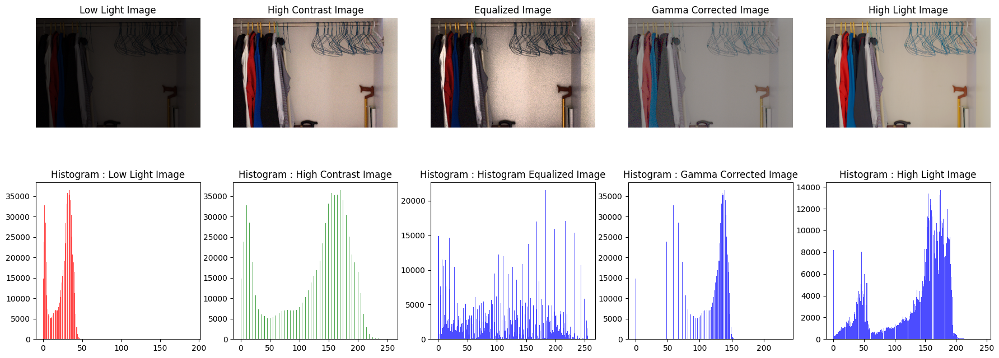

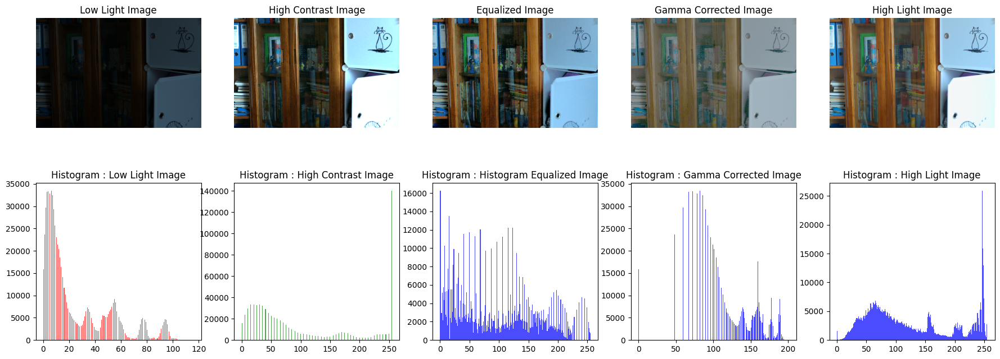

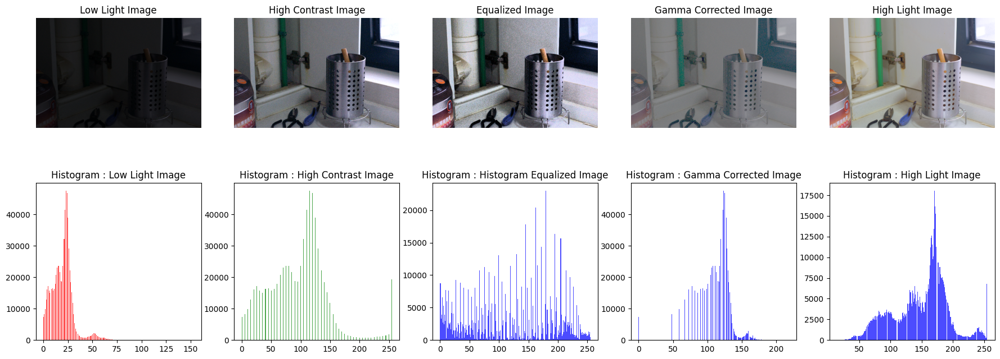

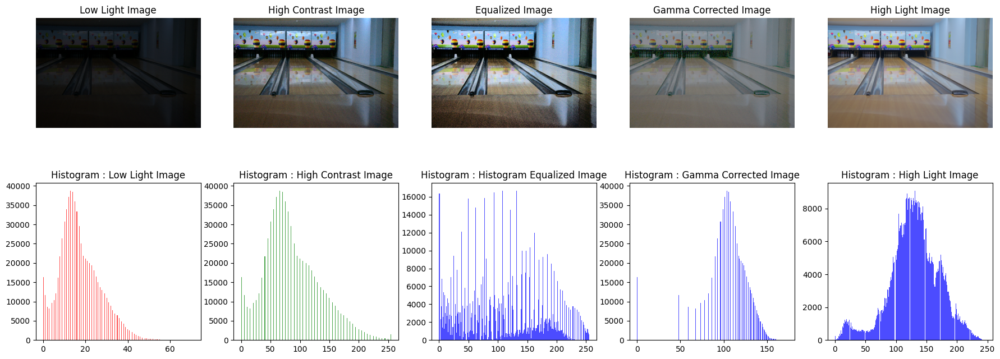

...

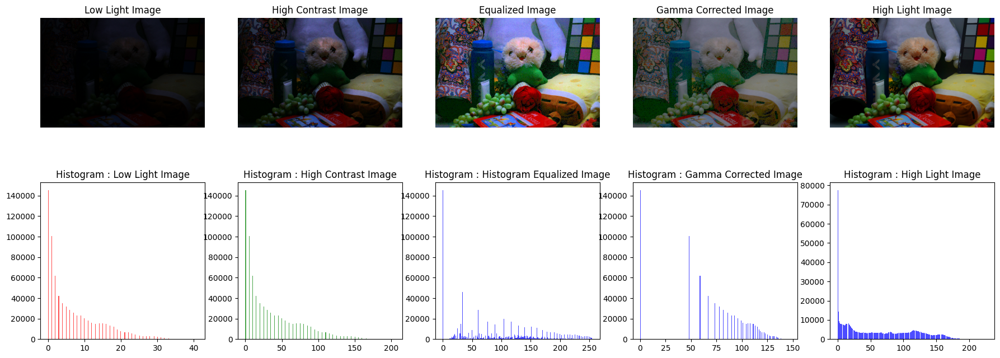

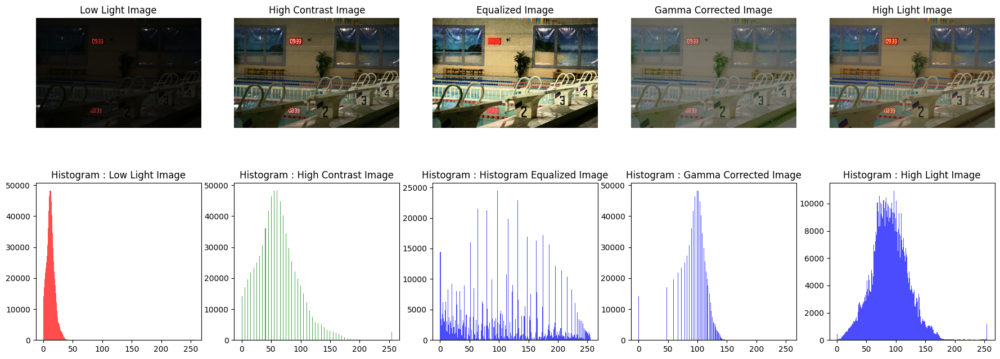

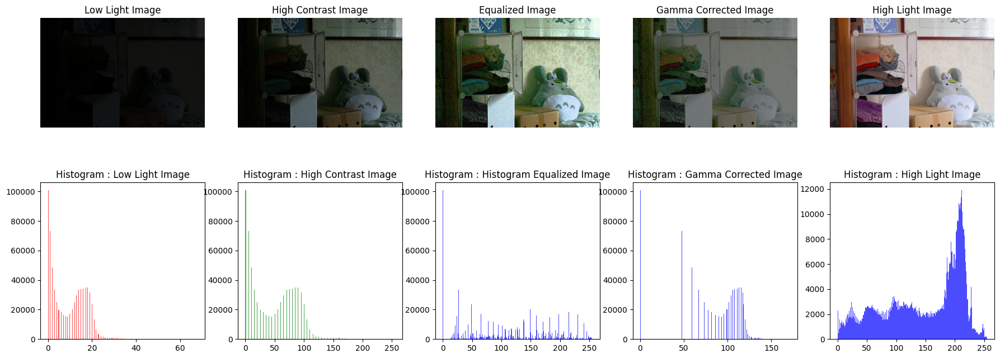

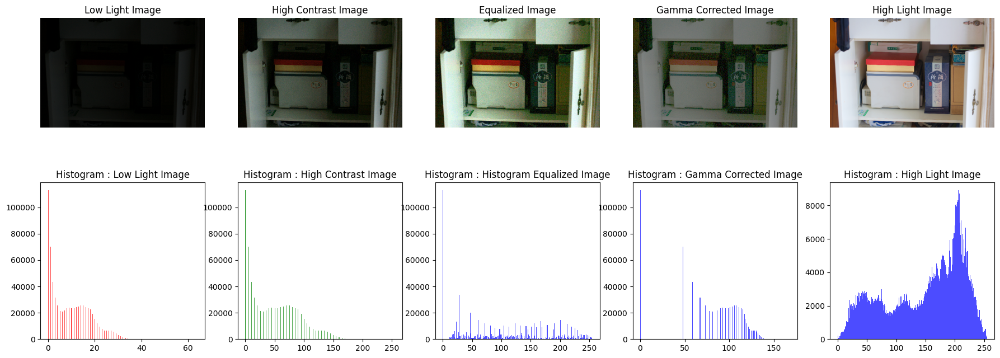

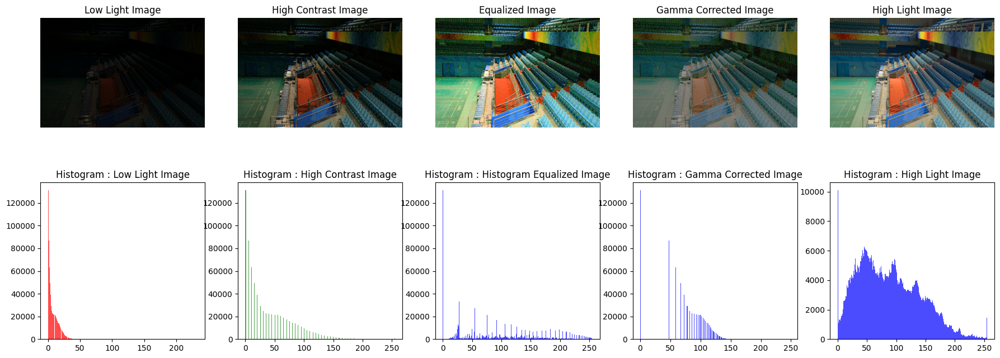

In [23]:
process_and_display_images(input_dir, high_contrast_dir, hist_eq_dir, gamma_dir, high_dir )

# Performance Evaluation Techniques

MSE : Mean Square Error </br>
Calculating the MSE of the High light image wuth the enhanced image

In [15]:
def calculate_mse(ref,img):
  """
    Calculate the Mean Squared Error (MSE) between two images.

    Parameters:
        ref: The first image as a NumPy array.
        img: The second image as a NumPy array.

    Returns:
        mse: The mean squared error between the two images.
    """
  mse = np.mean((ref - img) ** 2)
  return mse

PSNR : Peak Signal to Noise Ratio

In [16]:
# Function to compute PSNR
def calculate_psnr(ref, img):
    """
    Calculate the Peak Signal-to-Noise Ratio (PSNR) between two images.

    Parameters:
        ref: The first image as a NumPy array.
        img: The second image as a NumPy array.

    Returns:
        psnr: The PSNR value in decibels (dB).
    """
    mse = np.mean((ref - img) ** 2)
    if mse == 0:
        return 100  # Perfect match
    max_pixel = 255.0

    return 10 * np.log10((max_pixel ** 2) / mse)

SSIM : structural similarity index measure

In [17]:
# Function to compute SSIM
def calculate_ssim(ref, img):
    """
    Calculate the Structural Similarity Index (SSIM) between two images.

    Parameters:
        ref: The first image as a NumPy array.
        img: The second image as a NumPy array.

    Returns:
        ssim_value: The SSIM value (ranges from -1 to 1).
    """
    ref_gray = cv2.cvtColor(ref, cv2.COLOR_BGR2GRAY)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return ssim(ref_gray, img_gray)

Analyse the abouve paramters of obtained images

In [32]:
import pandas as pd

def evaluate_images(low_folder,high_contrast_folder, hist_eq_folder, gamma_folder, high_folder):
    """Evaluate image quality metrics for all images in a folder and compute average results for all enhancement methods."""

    ext = ['png', 'jpg', 'bmp']
    low_images = []
    [low_images.extend(glob.glob(os.path.join(low_folder, f'*.{e}'))) for e in ext]

    if not low_images:
        print("No images found in the low-light folder.")
        return

    results = []

    for low_file in low_images:
        filename = os.path.basename(low_file)

        # Find corresponding enhanced images
        hist_eq_file = os.path.join(hist_eq_folder, filename)
        gamma_file = os.path.join(gamma_folder, filename)
        high_contrast_file = os.path.join(high_contrast_folder, filename)
        # Find corresponding high-quality (ground truth) image
        high_file = os.path.join(high_folder, filename)

        if os.path.exists(hist_eq_file) and os.path.exists(gamma_file) and os.path.exists(high_contrast_file) and os.path.exists(high_file):
            # Load images
            hist_eq_img = cv2.imread(hist_eq_file)
            gamma_img = cv2.imread(gamma_file)
            high_contrast_img = cv2.imread(high_contrast_file)
            high_img = cv2.imread(high_file)

            # Compute quality metrics
            psnr_hist = calculate_psnr(high_img, hist_eq_img)
            ssim_hist = calculate_ssim(high_img, hist_eq_img)

            psnr_gamma = calculate_psnr(high_img, gamma_img)
            ssim_gamma = calculate_ssim(high_img, gamma_img)

            psnr_high_contrast = calculate_psnr(high_img, high_contrast_img)
            ssim_high_contrast = calculate_ssim(high_img, high_contrast_img)

            # Store results
            results.append({
                "Image": filename,
                "PSNR (Histogram Equalization)": psnr_hist,
                "SSIM (Histogram Equalization)": ssim_hist,
                "PSNR (Gamma Correction)": psnr_gamma,
                "SSIM (Gamma Correction)": ssim_gamma,
                "PSNR (High Contrast)": psnr_high_contrast,
                "SSIM (High Contrast)": ssim_high_contrast
            })
        else:
            print(f"Matching image not found for {filename}")

    # Convert results to a DataFrame
    df = pd.DataFrame(results)

    # Compute the average values
    avg_psnr_hist = df["PSNR (Histogram Equalization)"].mean()
    avg_ssim_hist = df["SSIM (Histogram Equalization)"].mean()

    avg_psnr_gamma = df["PSNR (Gamma Correction)"].mean()
    avg_ssim_gamma = df["SSIM (Gamma Correction)"].mean()

    avg_psnr_high_contrast = df["PSNR (High Contrast)"].mean()
    avg_ssim_high_contrast = df["SSIM (High Contrast)"].mean()

    print("\n📊 **Evaluation Results:**")
    print(df)
    print("\n📌 **Overall Average Metrics:**")
    print(f"🔹 Average PSNR (Histogram Equalization): {avg_psnr_hist:.4f} dB")
    print(f"🔹 Average SSIM (Histogram Equalization): {avg_ssim_hist:.4f}")
    print(f"🔹 Average PSNR (Gamma Correction): {avg_psnr_gamma:.4f} dB")
    print(f"🔹 Average SSIM (Gamma Correction): {avg_ssim_gamma:.4f}")
    print(f"🔹 Average PSNR (High Contrast): {avg_psnr_high_contrast:.4f} dB")
    print(f"🔹 Average SSIM (High Contrast): {avg_ssim_high_contrast:.4f}")

In [50]:
from IPython.display import display

def evaluate_images(low_folder, high_contrast_folder, hist_eq_folder, gamma_folder, high_folder):
    """Evaluate image quality metrics for all images in a folder and compute average results for all enhancement methods."""

    ext = ['png', 'jpg', 'bmp']
    low_images = []
    [low_images.extend(glob.glob(os.path.join(low_folder, f'*.{e}'))) for e in ext]

    if not low_images:
        print("No images found in the low-light folder.")
        return

    results = []

    for low_file in low_images:
        filename = os.path.basename(low_file)

        # Find corresponding enhanced images
        hist_eq_file = os.path.join(hist_eq_folder, filename)
        gamma_file = os.path.join(gamma_folder, filename)
        high_contrast_file = os.path.join(high_contrast_folder, filename)
        # Find corresponding high-quality (ground truth) image
        high_file = os.path.join(high_folder, filename)

        if os.path.exists(hist_eq_file) and os.path.exists(gamma_file) and os.path.exists(high_contrast_file) and os.path.exists(high_file):
            # Load images
            hist_eq_img = cv2.imread(hist_eq_file)
            gamma_img = cv2.imread(gamma_file)
            high_contrast_img = cv2.imread(high_contrast_file)
            high_img = cv2.imread(high_file)

            # Compute quality metrics
            mse_hist = calculate_mse(high_img, hist_eq_img)
            psnr_hist = calculate_psnr(high_img, hist_eq_img)
            ssim_hist = calculate_ssim(high_img, hist_eq_img)

            mse_gamma = calculate_mse(high_img, gamma_img)
            psnr_gamma = calculate_psnr(high_img, gamma_img)
            ssim_gamma = calculate_ssim(high_img, gamma_img)

            mse_high_contrast = calculate_mse(high_img, high_contrast_img)
            psnr_high_contrast = calculate_psnr(high_img, high_contrast_img)
            ssim_high_contrast = calculate_ssim(high_img, high_contrast_img)

            # Store results
            results.append([filename, mse_hist, psnr_hist, ssim_hist, mse_gamma, psnr_gamma, ssim_gamma, mse_high_contrast,  psnr_high_contrast, ssim_high_contrast])
        else:
            print(f"Matching image not found for {filename}")

    # Convert results to a DataFrame with MultiIndex columns
    columns = pd.MultiIndex.from_tuples([
        ("Image", ""),
        ("Histogram Equalization", "MSE"), ("Histogram Equalization", "PSNR"), ("Histogram Equalization", "SSIM"),
        ("Gamma Correction", "MSE"), ("Gamma Correction", "PSNR"), ("Gamma Correction", "SSIM"),
        ("High Contrast", "MSE"), ("High Contrast", "PSNR"), ("High Contrast", "SSIM")
    ])

    df = pd.DataFrame(results, columns=columns)

    # Compute the average values
    avg_values = df.iloc[:, 1:].mean()
    avg_values_df = pd.DataFrame(avg_values).transpose()
    avg_values_df.insert(0, ("Image", ""), "Average")

    # Append the average row to the DataFrame
    df = pd.concat([df, avg_values_df], ignore_index=True)

    print("\n📊 **Evaluation Results:** \n")
    display(df)

    # Compute the average values
    avg_mse_hist = df["Histogram Equalization", "MSE"].mean()
    avg_psnr_hist = df["Histogram Equalization", "PSNR"].mean()
    avg_ssim_hist = df["Histogram Equalization", "SSIM"].mean()

    avg_mse_gamma = df["Gamma Correction", "MSE"].mean()
    avg_psnr_gamma = df["Gamma Correction", "PSNR"].mean()
    avg_ssim_gamma = df["Gamma Correction", "SSIM"].mean()

    avg_mse_high_contrast = df["High Contrast", "MSE"].mean()
    avg_psnr_high_contrast = df["High Contrast", "PSNR"].mean()
    avg_ssim_high_contrast = df["High Contrast", "SSIM"].mean()


    print("\n📌 **Overall Average Metrics:**")
    print()
    print(f"🔹 Average MSE (Histogram Equalization): {avg_mse_hist:.4f}")
    print(f"🔹 Average PSNR (Histogram Equalization): {avg_psnr_hist:.4f} dB")
    print(f"🔹 Average SSIM (Histogram Equalization): {avg_ssim_hist:.4f}")
    print()
    print(f"🔹 Average MSE (Gamma Correction): {avg_mse_gamma:.4f}")
    print(f"🔹 Average PSNR (Gamma Correction): {avg_psnr_gamma:.4f} dB")
    print(f"🔹 Average SSIM (Gamma Correction): {avg_ssim_gamma:.4f}")
    print()
    print(f"🔹 Average MSE (High Contrast): {avg_mse_high_contrast:.4f}")
    print(f"🔹 Average PSNR (High Contrast): {avg_psnr_high_contrast:.4f} dB")
    print(f"🔹 Average SSIM (High Contrast): {avg_ssim_high_contrast:.4f}")


In [51]:
evaluate_images(input_dir, high_contrast_dir, hist_eq_dir, gamma_dir, high_dir )


📊 **Evaluation Results:** 



Image Histogram Equalization                      Gamma Correction  \
                               MSE       PSNR      SSIM              MSE   
0   547.png             103.904679  27.964453  0.410715        95.082929   
1   146.png             106.445217  27.859542  0.416822       111.692719   
2     1.png             100.889024  28.092364  0.713123       101.969329   
3   111.png             103.152144  27.996021  0.441865       109.946879   
4   669.png             101.682061  28.058360  0.422285       103.429793   
5   780.png              93.167028  28.438181  0.381032        96.849153   
6    79.png             108.709669  27.768122  0.520332       105.449785   
7    22.png             103.940846  27.962941  0.610177       101.597622   
8   665.png             109.437146  27.739156  0.359456       113.614762   
9   179.png             104.802564  27.927085  0.445839       110.720101   
10  493.png              94.490751  28.376911  0.542185        90.236558   
11  748.png             108.582794  27.773193  0.432720        84.191815   
12   23.png             106.754199  27.846954  0.419194       112.008506   
13   55.png             107.541571  27.815040  0.464875       115.209011   
14  778.png             100.621436  28.103898  0.614707        97.645578   
15  Average             103.608075  27.981481  0.479689       103.309636   

                        High Contrast                       
         PSNR      SSIM           MSE       PSNR      SSIM  
0   28.349778  0.757365    110.513137  27.696665  0.666650  
1   27.650555  0.824551     85.550976  28.808554  0.716046  
2   28.046108  0.835230    106.505472  27.857084  0.770113  
3   27.718975  0.799265    112.853511  27.605653  0.652832  
4   27.984347  0.811292    116.052647  27.484253  0.610325  
5   28.269845  0.602432     91.515982  28.515834  0.698623  
6   27.900347  0.804377    115.952628  27.487998  0.689098  
7   28.061968  0.763187    116.499342  27.467569  0.650771  
8   27.576456  0.666495    118.180026  27.405363  0.422434  
9   27.688539  0.790590    106.120364  27.872816  0.722894  
10  28.576978  0.588335     91.561694  28.513665  0.520122  
11  28.878105  0.829001    113.352376  27.586497  0.719992  
12  27.638294  0.585594     89.384762  28.618169  0.345493  
13  27.515939  0.597456     90.155014  28.580905  0.339521  
14  28.234278  0.660327    111.928064  27.641414  0.472156  
15  28.006034  0.727700    105.075066  27.942829  0.599805


📌 **Overall Average Metrics:**

🔹 Average MSE (Histogram Equalization): 103.6081
🔹 Average PSNR (Histogram Equalization): 27.9815 dB
🔹 Average SSIM (Histogram Equalization): 0.4797

🔹 Average MSE (Gamma Correction): 103.3096
🔹 Average PSNR (Gamma Correction): 28.0060 dB
🔹 Average SSIM (Gamma Correction): 0.7277

🔹 Average MSE (High Contrast): 105.0751
🔹 Average PSNR (High Contrast): 27.9428 dB
🔹 Average SSIM (High Contrast): 0.5998
